In [1]:
# !pip3 install --upgrade torch --user
# !pip3 install torchvision --user

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import os
import pickle
import tqdm

import torch
import torch.nn.functional as F
import torch.nn as nn


from torchvision import datasets
from torchvision import transforms

from utils.model_utils import PatchLoader
from utils.martemev_utils import compute_psnr, get_freer_gpu

from time import time

In [2]:
GPU_NUM = 2

K_CLOSEST = 8
HIDDEN_SIZE = 32
PATCH_SIZE = (33, 33)

gpu_num = get_freer_gpu()
device = torch.device('cuda:{}'.format(GPU_NUM))
device

device(type='cuda', index=2)

In [3]:
import utils.model_classes as classes

In [4]:
names = ['CNN_full.33.valid', 'GraphCNN_full.33.valid',
         'GraphCNN_Baseline.33.valid', "GraphCNN_FastBaseline.33.valid"]

models = [func()(K_CLOSEST, 1, hsize, patch_size=PATCH_SIZE) for func, name, hsize in \
                 zip([classes.get_CNN, classes.get_GCNN, classes.get_GCNN_baseline, classes.get_GCNN_fast_baseline],
                     names, [32, 32, 32, 16])]



for name, model in zip(names, models):
    model.load_state_dict(torch.load('./SavedModels/{}.state_dict'.format(name)))
    model.eval()
    model.cpu()

In [5]:
val_images_clear =  torch.load('../Data/val/clear/normalized_data.tensor')
val_images_noised =  torch.load('../Data/val/noised/normalized_data.tensor')

In [6]:
from collections import defaultdict

psnrs = defaultdict(list)
mses = defaultdict(list)
times = defaultdict(list)


for name, model in zip(names, models):
    model.cuda(device)
    model.eval()
    for clear_image, noised_image in zip(tqdm.tqdm_notebook(val_images_clear, desc=name), val_images_noised):
        
        start_time = time()
        denoised_image = model.forward_image(noised_image, device)
        end_time = time() - start_time
        denoised_image = denoised_image.cpu().data
        
        mse = nn.MSELoss()(clear_image, denoised_image)
        mses[name].append(mse)
        psnr = compute_psnr(clear_image, denoised_image)
        psnrs[name].append(psnr)
        times[name].append(end_time)
    model.cpu()
    print("Mean MSE of {} = {}".format(name, np.mean(mses[name])))
    print("Mean PSNR of {} = {}".format(name, np.mean(psnrs[name])))
    print("Mean process time of {} = {}".format(name, np.mean(times[name])))
        


Mean MSE of CNN_full.33.valid = 0.00984394270926714
Mean PSNR of CNN_full.33.valid = 41.45508201922846
Mean process time of CNN_full.33.valid = 0.8195342540740966



Mean MSE of GraphCNN_full.33.valid = 0.025932004675269127
Mean PSNR of GraphCNN_full.33.valid = 45.48023096853831
Mean process time of GraphCNN_full.33.valid = 9.516343569755554



Mean MSE of GraphCNN_Baseline.33.valid = 0.016015369445085526
Mean PSNR of GraphCNN_Baseline.33.valid = 35.26961050623082
Mean process time of GraphCNN_Baseline.33.valid = 5.669749534130096



Mean MSE of GraphCNN_FastBaseline.33.valid = 0.028307786211371422
Mean PSNR of GraphCNN_FastBaseline.33.valid = 36.454203868510774
Mean process time of GraphCNN_FastBaseline.33.valid = 3.570851731300354


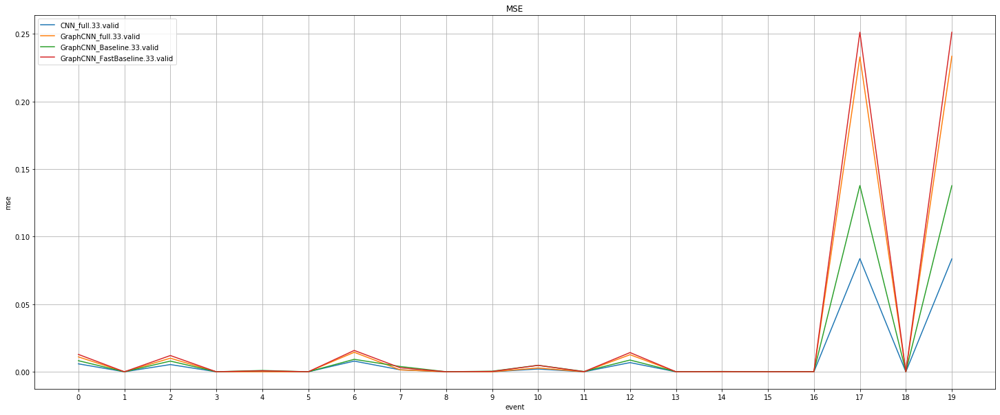

In [11]:
plt.figure(figsize=(25, 10))

plt.xticks(list(range(0, 20)))

for name in names:
    plt.plot(mses[name], label=name)
    
plt.yscale('linear')
plt.xlabel('event')
plt.ylabel('mse')

plt.legend()
plt.grid()
plt.title('MSE')
plt.show()

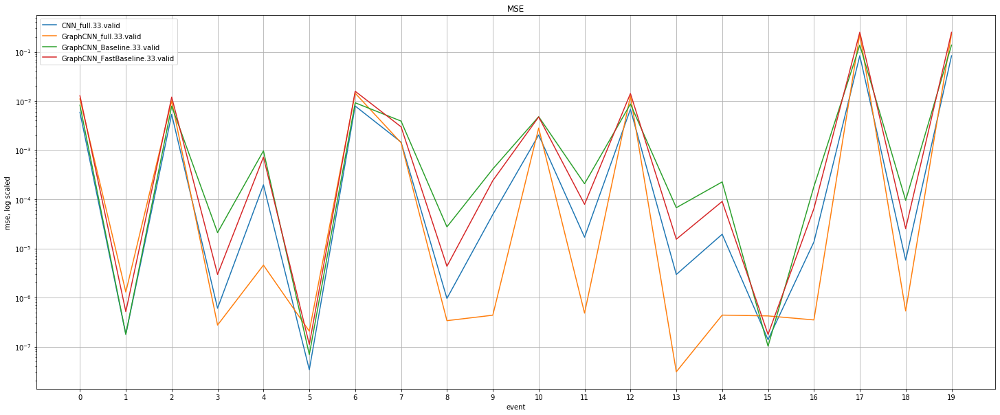

In [12]:
plt.figure(figsize=(25, 10))

plt.xticks(list(range(0, 20)))

for name in names:
    plt.plot(mses[name], label=name)
    
plt.yscale('log')
plt.xlabel('event')
plt.ylabel('mse, log scaled')

plt.legend()
plt.grid()
plt.title('MSE')
plt.show()

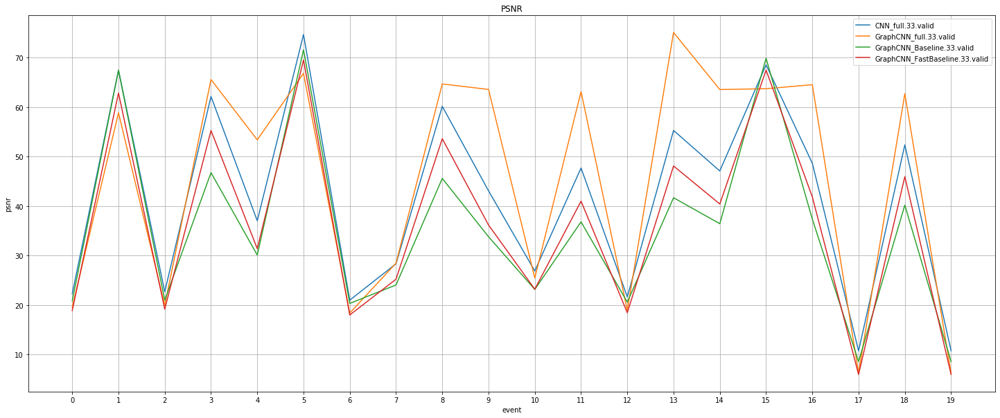

In [13]:
plt.figure(figsize=(25, 10))

plt.xticks(list(range(0, 20)))

for name in names:
    plt.plot(psnrs[name], label=name)

plt.xlabel('event')
plt.ylabel('psnr')

plt.legend()
plt.grid()
plt.title('PSNR')
plt.show()

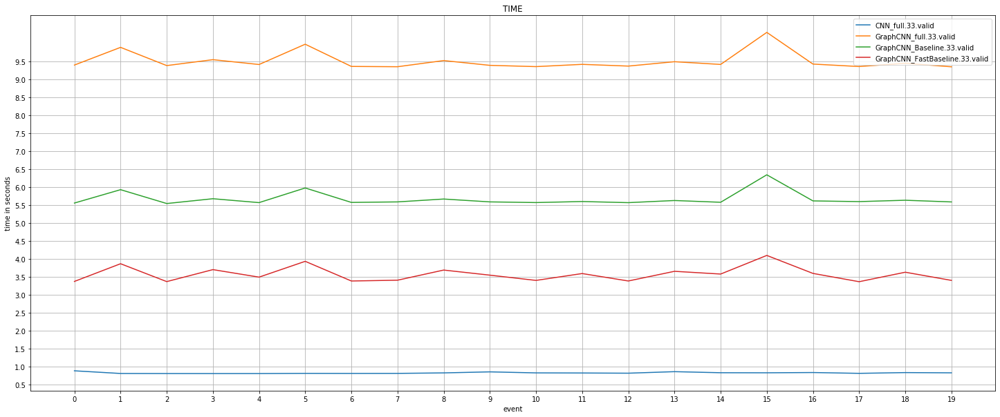

In [14]:
plt.figure(figsize=(25, 10))

plt.xticks(list(range(0, 20)))
plt.yticks(np.arange(0, 10, 0.5))

for name in names:
    plt.plot(times[name], label=name)

plt.xlabel('event')
plt.ylabel('time in seconds')

plt.legend()
plt.grid()
plt.title('TIME')
plt.show()

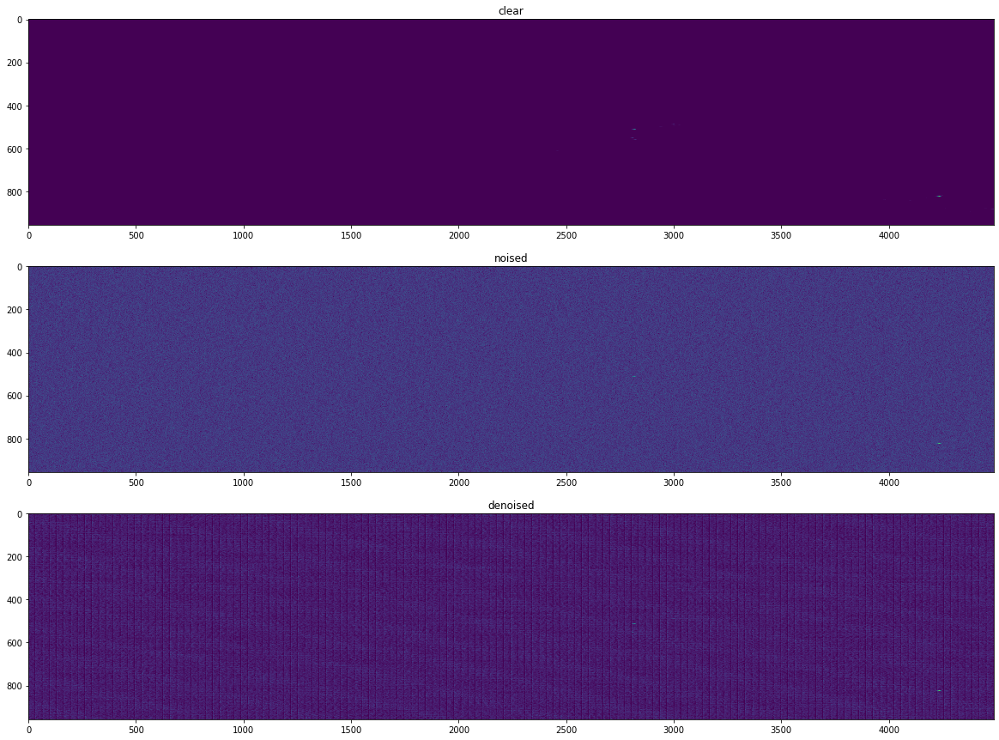

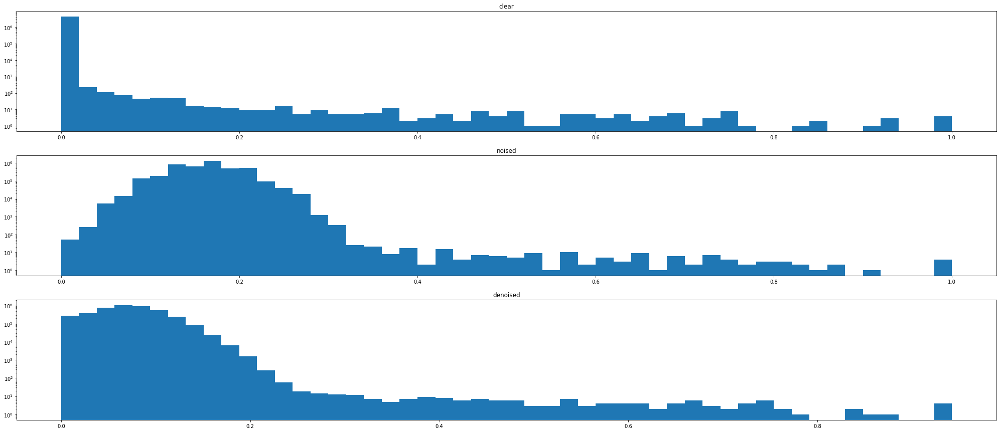

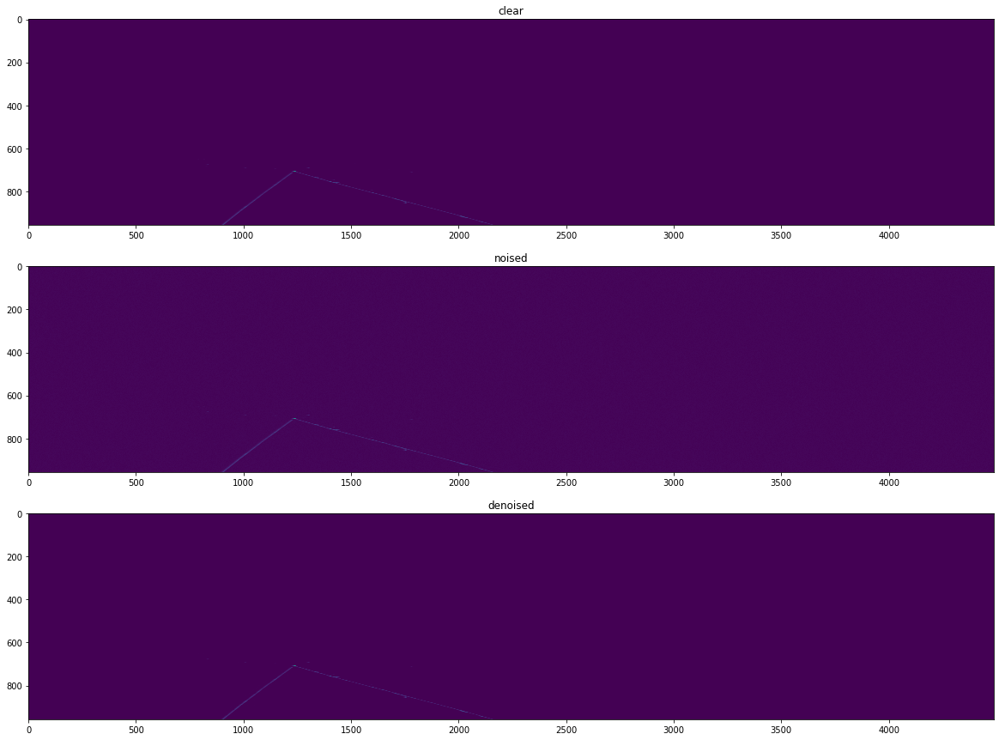

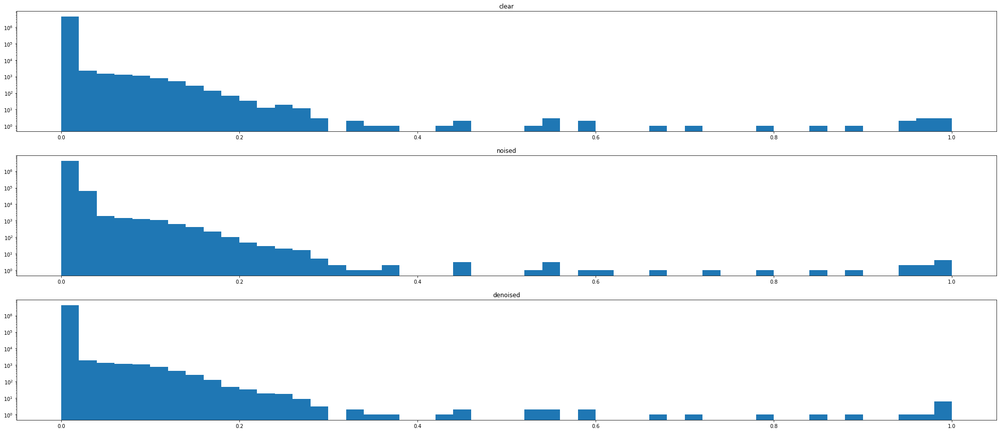

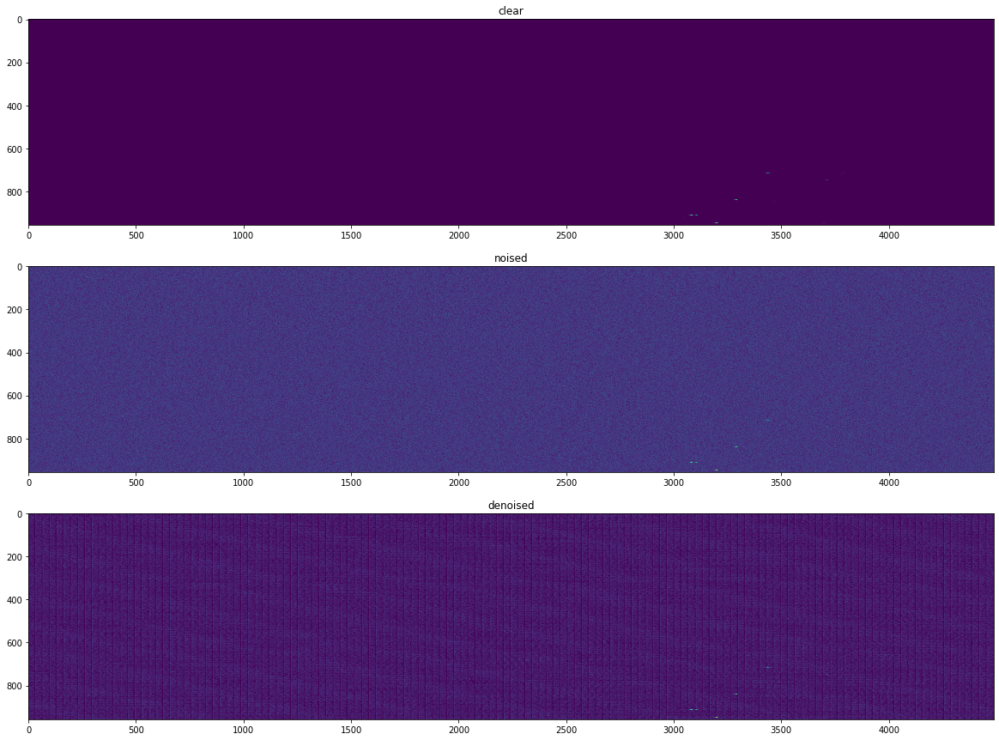

...

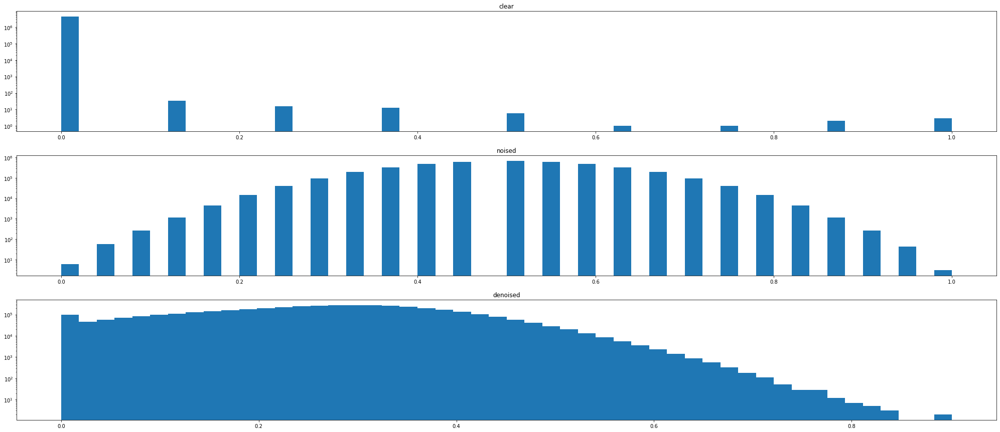

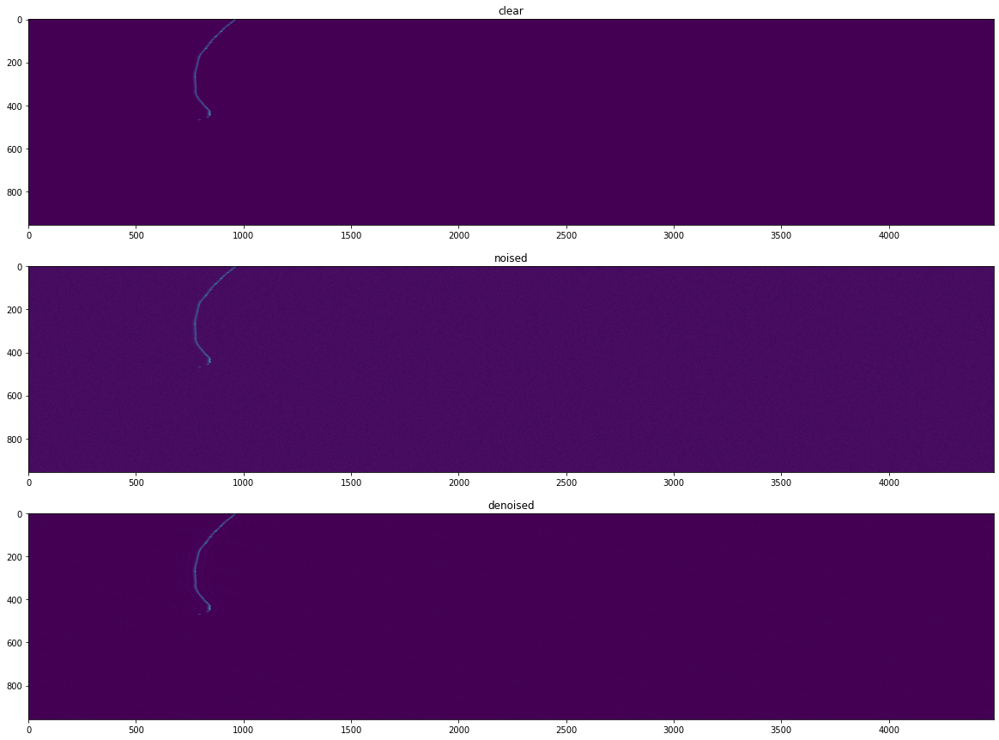

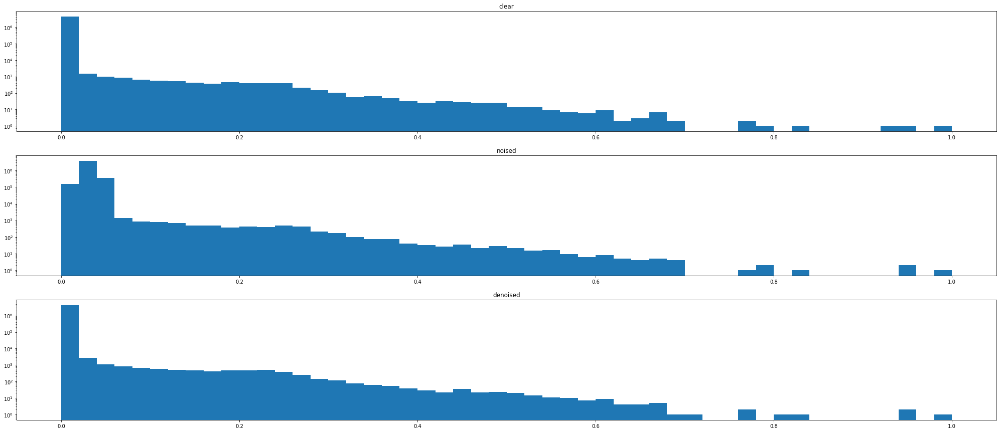

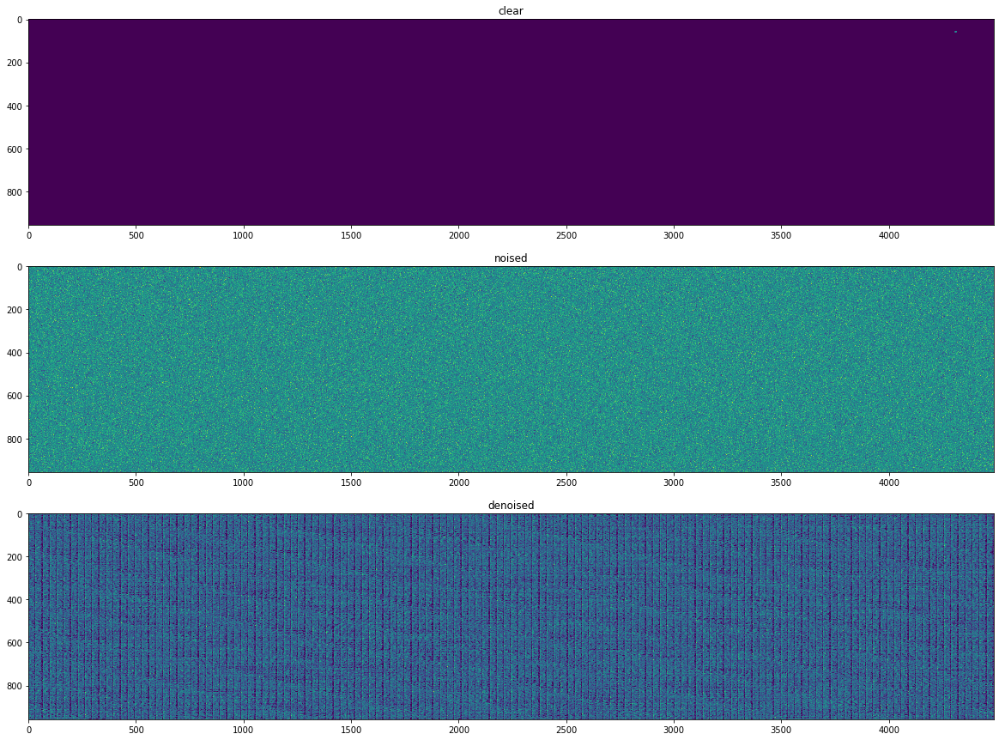

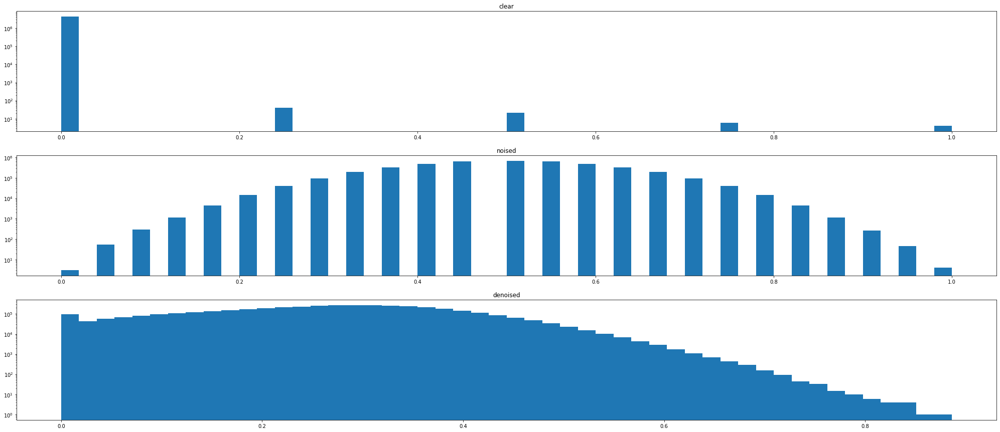

CNN(
  (preprocessing_blocks): ModuleList(
    (0): PreProcessBlock(
      (conv): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (activ): LeakyReLU(negative_slope=0.05)
      (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (GC): GraphConv(
        (conv1): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
        (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv3): Conv2d(32, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      )
    )
    (1): PreProcessBlock(
      (conv): Conv2d(1, 32, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
      (activ): LeakyReLU(negative_slope=0.05)
      (bn): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (GC): GraphConv(
        (conv1): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
        (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (conv3): Conv2d(32, 

In [42]:
model = models[0]
name_model = names[0]
model.cuda(device)
os.makedirs('Plots/' + name, exist_ok=True)
for index in range(len(val_images_clear)):
    img_index = torch.Tensor([index]).long()
    clear_image = val_images_clear[img_index]
    noised_image = val_images_noised[img_index]
    start_time = time()
    denoised_image = model.forward_image(noised_image.squeeze(0), device).cpu().data.unsqueeze(0)

    plt.figure(figsize=(35, 15))
    for ind, (im, name) in enumerate(zip([clear_image, noised_image, denoised_image], ['clear', 'noised', 'denoised'])):
        plt.subplot(3, 1, ind+1)
        plt.imshow(im.squeeze(0))
        plt.title(name)
    plt.savefig(os.path.join("Plots", name_model, "MC11_index_{}_plot.pdf".format(index)))
    plt.show()    
    
    plt.figure(figsize=(35, 15))
    for ind, (im, name) in enumerate(zip([clear_image, noised_image, denoised_image], ['clear', 'noised', 'denoised'])):
        plt.subplot(3, 1, ind+1)
        plt.hist(im.view(-1), bins=50)
        plt.yscale('log')
        plt.title(name)
    plt.savefig(os.path.join("Plots", name_model, "MC11_index_{}_hist.pdf".format(index)))
    plt.show()  
model.cpu()
